In [1]:
import pandas as pd
import tensorflow as tf
import csv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import seaborn as sns
from sklearn import linear_model

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
train = pd.read_csv('/content/drive/MyDrive/kaggle/Titanic/train.csv')

test = pd.read_csv('/content/drive/MyDrive/kaggle/Titanic/test.csv')

### EDA

In [2]:
!pip install dataprep
from dataprep.eda import create_report

     |████████████████████████████████| 1.8MB 3.7MB/s 
     |████████████████████████████████| 10.1MB 10.2MB/s 
     |████████████████████████████████| 727kB 39.0MB/s 
     |████████████████████████████████| 81kB 8.5MB/s 
     |████████████████████████████████| 368kB 42.5MB/s 
     |████████████████████████████████| 1.3MB 37.5MB/s 
     |████████████████████████████████| 849kB 22.7MB/s 
     |████████████████████████████████| 71kB 8.0MB/s 
     |████████████████████████████████| 51kB 5.9MB/s 
     |████████████████████████████████| 1.5MB 33.5MB/s 
     |████████████████████████████████| 51kB 6.0MB/s 
     |████████████████████████████████| 296kB 36.5MB/s 
     |████████████████████████████████| 143kB 41.5MB/s 
     |████████████████████████████████| 112kB 45.3MB/s 
     |████████████████████████████████| 747kB 36.1MB/s 
  Created wheel for metaphone: filename=Metaphone-0.6-cp37-none-any.whl size=13905 sha256=5fa2e94b6f44b0b1b1326930680d122cae73de9a74cfe9980f2fdfd898b56926
  Stored in d

NumExpr defaulting to 2 threads.


DataPrep Report
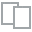
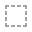
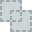
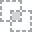
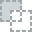
...
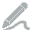
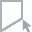
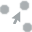
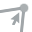
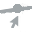

In [6]:
create_report(train)

## Data preprocess #1
### Sex -> (0,1) coding
### Embarked -> fill na median

In [9]:
train

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C


In [10]:
from sklearn.preprocessing import LabelEncoder
def fill_na(data):
    data["Embarked"] = data["Embarked"].fillna("S")
    data["Fare"] = data["Fare"].fillna(data["Fare"].mean())             
    return data

def Label_Encoding(data):
    label_encoder = LabelEncoder()
    data["Sex"] =label_encoder.fit_transform(data["Sex"])
    data["Embarked"] =label_encoder.fit_transform(data["Embarked"])             
    return data

In [11]:
train_raw = Label_Encoding(fill_na(train))
test_raw = Label_Encoding(fill_na(test))


In [12]:
train_raw

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",1,22.0,1,0,A/5 21171,7.2500,NaN,2
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",0,38.0,1,0,PC 17599,71.2833,C85,0
2,3,1,3,"Heikkinen, Miss. Laina",0,26.0,0,0,STON/O2. 3101282,7.9250,NaN,2
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",0,35.0,1,0,113803,53.1000,C123,2
4,5,0,3,"Allen, Mr. William Henry",1,35.0,0,0,373450,8.0500,NaN,2
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",1,27.0,0,0,211536,13.0000,NaN,2
887,888,1,1,"Graham, Miss. Margaret Edith",0,19.0,0,0,112053,30.0000,B42,2
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",0,NaN,1,2,W./C. 6607,23.4500,NaN,2
889,890,1,1,"Behr, Mr. Karl Howell",1,26.0,0,0,111369,30.0000,C148,0


## Data preprocess #2
### Age -> Predict missing value with linear regression (Linear imputation)

In [13]:
PREDICTORS_AGE = ["Pclass","Sex","SibSp","Parch","Fare","Embarked"]
TARGET_AGE = ["Age"]

In [14]:
def Age_Linear_Regression(train, test):
    alg = LinearRegression()
    alg.fit(train[PREDICTORS_AGE],train[TARGET_AGE])
    predictions = alg.predict(test[PREDICTORS_AGE])
    for age in range(len(test["Age"])):
        if test["Age"].isna()[age] == True:
            test["Age"][age] = predictions[age]

In [15]:
train_age = train_raw.dropna(subset = ["Age"])

In [16]:
Age_Linear_Regression(train_age, train_raw)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


In [17]:
train_age = train_raw.dropna(subset = ["Age"])
test_age = test_raw

In [18]:
Age_Linear_Regression(train_age, test_age)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


In [19]:
### Age < 0 -> Age = 0.5 (영유아로 가정)
def Age_revised(age):
    if age >=0:
        return age
    else:
        return 0.5

In [20]:
train_raw.Age = train_raw.Age.apply(Age_revised)
test_age.Age = test_age.Age.apply(Age_revised)

## Modeling

In [21]:
PREDICTORS = ["Pclass","Sex","Age","SibSp","Parch","Fare","Embarked"]
TARGET = ["Survived"]

In [22]:
def apply_linear_regression(train,test):
    alg = LinearRegression()
    alg.fit(train[PREDICTORS],train[TARGET])
    print(alg.intercept_,alg.coef_)
    
    predictions = alg.predict(test[PREDICTORS])
    predictions[predictions<=0.5] = 0
    predictions[predictions>0.5] = 1
    
    output = pd.DataFrame({
        "PassengerId": test["PassengerId"],
        "Survived" : predictions[:,0].astype(int)
    })
    output.to_csv("logistic_regression_age_revised.csv",index = False)

In [23]:
apply_linear_regression(train_raw,test_age)

[1.39334659] [[-1.83067228e-01 -4.99835906e-01 -6.47899495e-03 -5.32171675e-02
  -1.53796993e-02  2.51784659e-04 -3.12416596e-02]]
